<center><h1>Wang_Timothy_HW7</h1></center>

Name: Timothy Wang
<br>
Github Username: timothyswang
<br>
USC ID: 2697040790

## 1. Multi-class and Multi-Label Classification Using Support Vector Machines

Import packages

In [164]:
import os
import pandas as pd
import numpy as np
import seaborn
import sklearn.svm as svm
import sklearn.metrics as metrics
import sklearn.cluster as cluster
from statistics import mode

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from imblearn.over_sampling import SMOTE

### (a) Download the Anuran Calls (MFCCs) Data Set

In [2]:
#[1]
anuran_data = pd.read_csv("../data/Frogs_MFCCs.csv")

print(anuran_data)

      MFCCs_ 1  MFCCs_ 2  MFCCs_ 3  MFCCs_ 4  MFCCs_ 5  MFCCs_ 6  MFCCs_ 7   
0          1.0  0.152936 -0.105586  0.200722  0.317201  0.260764  0.100945  \
1          1.0  0.171534 -0.098975  0.268425  0.338672  0.268353  0.060835   
2          1.0  0.152317 -0.082973  0.287128  0.276014  0.189867  0.008714   
3          1.0  0.224392  0.118985  0.329432  0.372088  0.361005  0.015501   
4          1.0  0.087817 -0.068345  0.306967  0.330923  0.249144  0.006884   
...        ...       ...       ...       ...       ...       ...       ...   
7190       1.0 -0.554504 -0.337717  0.035533  0.034511  0.443451  0.093889   
7191       1.0 -0.517273 -0.370574  0.030673  0.068097  0.402890  0.096628   
7192       1.0 -0.582557 -0.343237  0.029468  0.064179  0.385596  0.114905   
7193       1.0 -0.519497 -0.307553 -0.004922  0.072865  0.377131  0.086866   
7194       1.0 -0.508833 -0.324106  0.062068  0.078211  0.397188  0.094596   

      MFCCs_ 8  MFCCs_ 9  MFCCs_10  ...  MFCCs_17  MFCCs_18  MF

In [3]:
#[2]
split_train = anuran_data.sample(frac=0.7)
print(split_train)

      MFCCs_ 1  MFCCs_ 2  MFCCs_ 3  MFCCs_ 4  MFCCs_ 5  MFCCs_ 6  MFCCs_ 7   
817    1.00000  0.213957 -0.169718  0.256532  0.485148  0.234842 -0.186338  \
89     1.00000  0.160767 -0.028136  0.329112  0.325524  0.222707  0.049999   
3106   1.00000  0.368571  0.214204  0.604333  0.306961  0.080369 -0.146984   
1957   1.00000  0.523763  0.312842  0.641030  0.130073 -0.056040 -0.125987   
4872   1.00000  0.235776  0.179336  0.507825  0.273008  0.079647 -0.067376   
...        ...       ...       ...       ...       ...       ...       ...   
2243   1.00000  0.065987  0.007596  0.579470  0.304514  0.051769 -0.171773   
5964   1.00000  0.154977  0.312289  0.330619  0.143283  0.174793  0.125442   
2593   1.00000  0.386187  0.457926  0.559557  0.075103 -0.035143 -0.142047   
5390   0.93141  0.626137  1.000000  0.375834 -0.223044  0.325943  0.121659   
3932   1.00000  0.572000  0.317222  0.527274  0.151436 -0.104943 -0.094916   

      MFCCs_ 8  MFCCs_ 9  MFCCs_10  ...  MFCCs_17  MFCCs_18  MF

In [4]:
#[2]
split_test = anuran_data.drop(split_train.index)
print(split_test)

      MFCCs_ 1  MFCCs_ 2  MFCCs_ 3  MFCCs_ 4  MFCCs_ 5  MFCCs_ 6  MFCCs_ 7   
3          1.0  0.224392  0.118985  0.329432  0.372088  0.361005  0.015501  \
5          1.0  0.099704 -0.033408  0.349895  0.344535  0.247569  0.022407   
13         1.0  0.126523 -0.040482  0.341129  0.381446  0.261154 -0.017049   
15         1.0  0.137623 -0.085808  0.322446  0.344695  0.285642  0.056517   
16         1.0  0.263944  0.090358  0.368888  0.356645  0.252806  0.063921   
...        ...       ...       ...       ...       ...       ...       ...   
7182       1.0 -0.616029 -0.302357  0.063417  0.095671  0.439930  0.069414   
7183       1.0 -0.547168 -0.266780  0.056115  0.048947  0.423631  0.081924   
7188       1.0 -0.512599 -0.171956  0.325813  0.169600  0.421567 -0.123749   
7191       1.0 -0.517273 -0.370574  0.030673  0.068097  0.402890  0.096628   
7192       1.0 -0.582557 -0.343237  0.029468  0.064179  0.385596  0.114905   

      MFCCs_ 8  MFCCs_ 9  MFCCs_10  ...  MFCCs_17  MFCCs_18  MF

### (b) Train a classifier for each label

#### (i) Research

[3]

Exact Match:

In exact match, we calculate subset accuracy. This means that we only count something as a correct classification if the set of predicted labels exactly matches the actual labels.

Hamming Loss:

In hamming loss, we calculate the ratio of incorrect labels in our prediction to the total number of labels.

#### (ii) Train a SVM for each of the labels

In [55]:
#[4]
train_x = split_train.drop(columns=["Family", "Genus", "Species", "RecordID"])
#[5] Standardize data
standardizer = StandardScaler()
train_x = standardizer.fit_transform(train_x)
# print(train_x)
train_fam_y = split_train["Family"]
train_gen_y = split_train["Genus"]
train_spec_y = split_train["Species"]
# print(train_gen_x)

#[4]
test_x = split_test.drop(columns=["Family", "Genus", "Species", "RecordID"])
#[5] Standardize data
test_x = standardizer.fit_transform(test_x)
# print(train_x)
test_fam_y = split_test["Family"].tolist()
test_gen_y = split_test["Genus"].tolist()
test_spec_y = split_test["Species"].tolist()

In [40]:
#Family Label

#Possible alpha values:
gamma_values = [.1, .2, .3, .4, .5, .6, .7, .8, .9, 1.0]
c_values = [.01, .1, 1, 10, 100]

accuracy_array = []
for this_gamma_value in gamma_values:
    inner_accuracy_array = []
    for this_c_value in c_values:
        #[6]
        this_crossval_model = svm.SVC(C=this_c_value, kernel="rbf", gamma=this_gamma_value, decision_function_shape="ovr")
        #[7]
        this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=train_x, y=train_fam_y, cv=10)

        inner_accuracy_array.append(this_crossval_scores.mean())
    accuracy_array.append(inner_accuracy_array)

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[[0.8514756697907793, 0.9704140237937455, 0.9896726782164158, 0.9896730726750608, 0.9896730726750608], [0.7823724320742214, 0.9720013253810471, 0.9857016630376471, 0.9860988828931175, 0.9860988828931175], [0.7444436555271545, 0.9481768121430149, 0.9827231058095871, 0.9835171510618826, 0.9835171510618826], [0.7380897156742087, 0.9086650730537411, 0.9777588437628199, 0.979546135883114, 0.979546135883114], [0.7301457130234466, 0.8604121303922497, 0.9729929944144656, 0.9749794881504623, 0.9749794881504623], [0.719821546909022, 0.8208913187541418, 0.9694176212565875, 0.9710068951371138, 0.9710068951371138], [0.7035343494588028, 0.7873327495345388, 0.9678303196692859, 0.9704120515005208, 0.9704120515005208], [0.6771237653444413, 0.7652935561235759, 0.9386443245290164, 0.9416232762157215, 0.9416232762157215], [0.6578627441699012, 0.7529821073558648, 0.9241479693268959, 0.9279205718072518, 0.9279205718072518], [0.64297074694689, 0.7458353056265582, 0.9054849474581085, 0.9124333364890024, 0.912

For Family Label -- appears that gamma=.1 and c_value = 10 works the best.

In [41]:
#Genus Label

#Possible alpha values:
gamma_values = [.1, .2, .3, .4, .5, .6, .7, .8, .9, 1.0]
c_values = [.01, .1, 1, 10, 100]

accuracy_array = []
for this_gamma_value in gamma_values:
    inner_accuracy_array = []
    for this_c_value in c_values:
        #[6]
        this_crossval_model = svm.SVC(C=this_c_value, kernel="rbf", gamma=this_gamma_value, decision_function_shape="ovr")
        #[7]
        this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=train_x, y=train_gen_y, cv=10)

        inner_accuracy_array.append(this_crossval_scores.mean())
    accuracy_array.append(inner_accuracy_array)

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[[0.7783990501435829, 0.95075538830509, 0.9849056454921266, 0.9862965066742403, 0.9862965066742403], [0.7218044905172143, 0.9179940200069424, 0.9779560730852976, 0.9793457508914767, 0.9793457508914767], [0.7059192464262047, 0.8838410016093914, 0.9706108586575783, 0.9729925999558207, 0.9729925999558207], [0.6985728486225504, 0.8479018744674809, 0.9533410647227745, 0.9571116949099057, 0.9571116949099057], [0.691424074600019, 0.8073905771718893, 0.9376534444128877, 0.9430149263151251, 0.9430149263151251], [0.6810991195683045, 0.7744229070024299, 0.921371374925053, 0.9267336457445803, 0.9267336457445803], [0.6628266117580234, 0.7438448673041119, 0.904492883966045, 0.9126333270219951, 0.9126333270219951], [0.6382041086812459, 0.7233929754804507, 0.8884080438006879, 0.8965496702325726, 0.8965496702325726], [0.6179502350973525, 0.7130680204487361, 0.8719267726971506, 0.8820529205718073, 0.8820529205718073], [0.6056391807882863, 0.7075097036826659, 0.8538570166303765, 0.865969263782385, 0.8659

For Genus Label -- appears that gamma=.1 and c_value = 10 works the best.

In [42]:
#Species Label

#Possible alpha values:
gamma_values = [.1, .2, .3, .4, .5, .6, .7, .8, .9, 1.0]
c_values = [.01, .1, 1, 10, 100]

accuracy_array = []
for this_gamma_value in gamma_values:
    inner_accuracy_array = []
    for this_c_value in c_values:
        #[6]
        this_crossval_model = svm.SVC(C=this_c_value, kernel="rbf", gamma=this_gamma_value, decision_function_shape="ovr")
        #[7]
        this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=train_x, y=train_spec_y, cv=10)

        inner_accuracy_array.append(this_crossval_scores.mean())
    accuracy_array.append(inner_accuracy_array)

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[[0.809573511313074, 0.9573077408564485, 0.9805401716684022, 0.9829219129666444, 0.9829219129666444], [0.6672027359651614, 0.9305034870144213, 0.9727949761746977, 0.9743838555965793, 0.9743838555965793], [0.6163653002619205, 0.8818564801666193, 0.96703627441699, 0.9698160244879925, 0.9698160244879925], [0.6034582189403264, 0.8310249613430528, 0.9495660954905487, 0.9519482312474359, 0.9519482312474359], [0.5957138123639117, 0.7748236769857048, 0.9328875950645333, 0.9376538388715329, 0.9376538388715329], [0.5855876644892549, 0.7297496765439113, 0.9160075262709458, 0.9215682097888858, 0.9215682097888858], [0.5675135693773864, 0.6886459023635962, 0.8943655527154533, 0.9035016093912714, 0.9035016093912714], [0.5430894789990217, 0.6604488150462305, 0.8695450313989082, 0.8832469468900881, 0.8832469468900881], [0.5228356054151283, 0.6457575972735019, 0.8486939474265519, 0.8619986430622614, 0.8619986430622614], [0.5097305058537662, 0.6312608476127364, 0.8300281643472498, 0.8427364385117864, 0.8

For Species Label -- appears that gamma=.1 and c_value = 10 works the best.

In [62]:
#[3]
def exact_match(predict_fam, predict_gen, predict_spec, test_fam, test_gen, test_spec):
    total = float(len(predict_fam))
    correct = 0.0
    for i in range(len(predict_fam)):
        if predict_fam[i] == test_fam[i] and predict_gen[i] == test_gen[i] and predict_spec[i] == test_spec[i]:
            correct += 1.0

    score = correct / total

    return score

#[3]
def hamming_loss(predict_fam, predict_gen, predict_spec, test_fam, test_gen, test_spec):
    total = float(len(predict_fam)) * 3.0
    incorrect = 0.0
    for i in range(len(predict_fam)):
        if predict_fam[i] != test_fam[i]:
            incorrect += 1.0
        if predict_gen[i] != test_gen[i]:
            incorrect += 1.0
        if predict_spec[i] != test_spec[i]:
            incorrect += 1.0

    score = 1.0 - (incorrect / total)

    return score

In [63]:
#[6]
family_classifier = svm.SVC(C=10, kernel="rbf", gamma=0.1, decision_function_shape="ovr").fit(X=train_x, y=train_fam_y)
genus_classifier = svm.SVC(C=10, kernel="rbf", gamma=0.1, decision_function_shape="ovr").fit(X=train_x, y=train_gen_y)
species_classifier = svm.SVC(C=10, kernel="rbf", gamma=0.1, decision_function_shape="ovr").fit(X=train_x, y=train_spec_y)

predict_fam_y = family_classifier.predict(X=test_x).tolist()
predict_gen_y = genus_classifier.predict(X=test_x).tolist()
predict_spec_y = species_classifier.predict(X=test_x).tolist()

exact_match_score = exact_match(predict_fam_y, predict_gen_y, predict_spec_y, test_fam_y, test_gen_y, test_spec_y)
print("Exact Match Accuracy Score:", exact_match_score)
hamming_match_score = hamming_loss(predict_fam_y, predict_gen_y, predict_spec_y, test_fam_y, test_gen_y, test_spec_y)
print("Hamming Accuracy Score (1 - HammingLoss):", hamming_match_score)

Exact Match Accuracy Score: 0.9810097267253358
Hamming Accuracy Score (1 - HammingLoss): 0.9878029952138335


For this part, I got an exact match accuracy score of about 98% -- so for about 98% of the test datapoints, all three labels predicted for that test datapoint matched exactly with all three of the actual labels.

I got a Hamming accuracy score of about 99% and a Hamming Loss of about 1% -- so for all the labels in the test datapoints (3 * #test datapoints), about 99% of them were correctly predicted.

#### (iii) Repeat 1(b)ii with L1-penalized SVMs

In [73]:
#I already standardized the attributes.

#Family Label
#Possible c values:
c_values = [.01, .1, 1, 10, 100]

accuracy_array = []
for this_c_value in c_values:
    #[8]
    this_crossval_model = svm.LinearSVC(penalty="l1", C=this_c_value, dual=False, max_iter=10000)
    #[7]
    this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=train_x, y=train_fam_y, cv=10)

    accuracy_array.append(this_crossval_scores.mean())

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[0.9277190034396794, 0.9388368203477547, 0.9412181671873519, 0.9410197544889393, 0.9410197544889393]
0.9412181671873519
2


For Family Label -- appears that c_value = 1 works the best.

In [74]:
#Genus Label
#Possible c values:
c_values = [.01, .1, 1, 10, 100]

accuracy_array = []
for this_c_value in c_values:
    #[8]
    this_crossval_model = svm.LinearSVC(penalty="l1", C=this_c_value, dual=False, max_iter=10000)
    #[7]
    this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=train_x, y=train_gen_y, cv=10)

    accuracy_array.append(this_crossval_scores.mean())

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[0.9148142888699548, 0.9430066426835809, 0.9513474707311685, 0.9529359556944049, 0.9529359556944049]
0.9529359556944049
3


For Genus Label -- appears that c_value = 10 works the best.

In [76]:
#Species Label
#Possible c values:
c_values = [.1, 1, 10, 100, 1000]

accuracy_array = []
for this_c_value in c_values:
    #[8]
    this_crossval_model = svm.LinearSVC(penalty="l1", C=this_c_value, dual=False, max_iter=10000)
    #[7]
    this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=train_x, y=train_spec_y, cv=10)

    accuracy_array.append(this_crossval_scores.mean())

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[0.948764161065354, 0.9590895105557132, 0.9604791883618921, 0.9606783899775946, 0.9606783899775946]
0.9606783899775946
3


For Species Label -- appears that c_value = 100 works the best.

In [77]:
#[8]
family_classifier = svm.LinearSVC(penalty="l1", C=1, dual=False, max_iter=10000).fit(X=train_x, y=train_fam_y)
genus_classifier = svm.LinearSVC(penalty="l1", C=10, dual=False, max_iter=10000).fit(X=train_x, y=train_gen_y)
species_classifier = svm.LinearSVC(penalty="l1", C=100, dual=False, max_iter=10000).fit(X=train_x, y=train_spec_y)

predict_fam_y = family_classifier.predict(X=test_x).tolist()
predict_gen_y = genus_classifier.predict(X=test_x).tolist()
predict_spec_y = species_classifier.predict(X=test_x).tolist()

exact_match_score = exact_match(predict_fam_y, predict_gen_y, predict_spec_y, test_fam_y, test_gen_y, test_spec_y)
print("Exact Match Accuracy Score:", exact_match_score)
hamming_match_score = hamming_loss(predict_fam_y, predict_gen_y, predict_spec_y, test_fam_y, test_gen_y, test_spec_y)
print("Hamming Accuracy Score (1 - HammingLoss):", hamming_match_score)

Exact Match Accuracy Score: 0.9018063918480778
Hamming Accuracy Score (1 - HammingLoss): 0.9400957233287015


For this part, I got an exact match accuracy score of about 90% -- so for about 90% of the test datapoints, all three labels predicted for that test datapoint matched exactly with all three of the actual labels.

I got a Hamming accuracy score of about 94% and a Hamming loss of about 6% -- so for all the labels in the test datapoints (3 * #test datapoints), about 94% of them were correctly predicted.

#### (iv) Repeat 1(b)iii by using SMOTE or any other method for imbalance

In [86]:
#[9]
smote_transformer = SMOTE()
smote_train_fam_x, smote_train_fam_y = smote_transformer.fit_resample(train_x, train_fam_y)
smote_train_gen_x, smote_train_gen_y = smote_transformer.fit_resample(train_x, train_gen_y)
smote_train_spec_x, smote_train_spec_y = smote_transformer.fit_resample(train_x, train_spec_y)

In [89]:
#Family Label
#Possible c values:
c_values = [.1, 1, 10, 100, 1000]

accuracy_array = []
for this_c_value in c_values:
    #[8]
    this_crossval_model = svm.LinearSVC(penalty="l1", C=this_c_value, dual=False, max_iter=10000)
    #[7]
    this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=smote_train_fam_x, y=smote_train_fam_y, cv=10)

    accuracy_array.append(this_crossval_scores.mean())

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[0.9526759117257153, 0.9538853292090146, 0.9538048140157521, 0.9538854591770424, 0.9538854591770424]
0.9538854591770424
3


For Family Label -- appears that c_value = 100 works the best.

In [92]:
#Genus Label
#Possible c values:
c_values = [.1, 1, 10, 100, 1000]

accuracy_array = []
for this_c_value in c_values:
    #[8]
    this_crossval_model = svm.LinearSVC(penalty="l1", C=this_c_value, dual=False, max_iter=100000)
    #[7]
    this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=smote_train_gen_x, y=smote_train_gen_y, cv=10)

    accuracy_array.append(this_crossval_scores.mean())

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[0.9528895344605053, 0.9562850362912328, 0.9571018338314918, 0.9572307921402683, 0.9572307921402683]
0.9572307921402683
3


For Genus Label -- appears that c_value = 100 works the best.

In [93]:
#Species Label
#Possible c values:
c_values = [.1, 1, 10, 100, 1000]

accuracy_array = []
for this_c_value in c_values:
    #[8]
    this_crossval_model = svm.LinearSVC(penalty="l1", C=this_c_value, dual=False, max_iter=10000)
    #[7]
    this_crossval_scores = cross_val_score(estimator=this_crossval_model, X=smote_train_spec_x, y=smote_train_spec_y, cv=10)

    accuracy_array.append(this_crossval_scores.mean())

print(accuracy_array)
print(np.max(accuracy_array))
print(np.argmax(accuracy_array))

[0.958547531619747, 0.9604651162790698, 0.9607915136678906, 0.9607915136678908, 0.9607915136678908]
0.9607915136678908
3


For Species Label -- appears that c_value = 100 works the best.

In [94]:
#[8]
family_classifier = svm.LinearSVC(penalty="l1", C=100, dual=False, max_iter=10000).fit(smote_train_fam_x, smote_train_fam_y)
genus_classifier = svm.LinearSVC(penalty="l1", C=100, dual=False, max_iter=100000).fit(smote_train_gen_x, smote_train_gen_y)
species_classifier = svm.LinearSVC(penalty="l1", C=100, dual=False, max_iter=10000).fit(smote_train_spec_x, smote_train_spec_y)

predict_fam_y = family_classifier.predict(X=test_x).tolist()
predict_gen_y = genus_classifier.predict(X=test_x).tolist()
predict_spec_y = species_classifier.predict(X=test_x).tolist()

exact_match_score = exact_match(predict_fam_y, predict_gen_y, predict_spec_y, test_fam_y, test_gen_y, test_spec_y)
print("Exact Match Accuracy Score:", exact_match_score)
hamming_match_score = hamming_loss(predict_fam_y, predict_gen_y, predict_spec_y, test_fam_y, test_gen_y, test_spec_y)
print("Hamming Accuracy Score (1 - HammingLoss):", hamming_match_score)

Exact Match Accuracy Score: 0.8531727651690597
Hamming Accuracy Score (1 - HammingLoss): 0.9249652616952293


For this part, I got an exact match accuracy score of about 85% -- so for about 85% of the test datapoints, all three labels predicted for that test datapoint matched exactly with all three of the actual labels.

I got a Hamming accuracy score of about 92% and a Hamming loss of about 8% -- so for all the labels in the test datapoints (3 * #test datapoints), about 92% of them were correctly predicted.

Comparing all the models trained, the first model I made (no L1 Penalty, no SMOTE), performed the best on the test data, with an exact match accuracy score of about 98% and a Hamming Loss of only about 1%. The model with the L1 penalty performed the second best on the test data, with an exact match accuracy score of about 90% and a Hamming loss of only about 6%. This model might have done worse than the first model because I was using a linear kernel rather than a Gaussian kernel. The last model, using SMOTE, performed the worse, with an exact match accuracy score of about 85% and a Hamming loss of about 8%. In terms of Hamming loss, this model did not perform significantly worse than the second model with just the L1 penalty added. My suspicion is that by overrepresenting the minority label, the classifier overpredicted the minority class versus the majority class.

That being said, I suspect that the above scores could change depending on how the data was split between training and test data. It's possible that another split would have resulted in better test scores.

## 2. K-Means Clustering on a Multi-Class and Multi-Label Data Set

### (a) Use k-means clustering

In [150]:
#[1]
anuran_data_kmeans = pd.read_csv("../data/Frogs_MFCCs.csv")

#[10] Assigning each family, genus, and species an index number, to make things easier to deal with
anuran_data_kmeans.loc[anuran_data_kmeans["Family"] == "Bufonidae", "Family"] = 1.0
anuran_data_kmeans.loc[anuran_data_kmeans["Family"] == "Dendrobatidae", "Family"] = 2.0
anuran_data_kmeans.loc[anuran_data_kmeans["Family"] == "Hylidae", "Family"] = 3.0
anuran_data_kmeans.loc[anuran_data_kmeans["Family"] == "Leptodactylidae", "Family"] = 4.0

anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Adenomera", "Genus"] = 1.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Ameerega", "Genus"] = 2.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Dendropsophus", "Genus"] = 3.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Hypsiboas", "Genus"] = 4.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Leptodactylus", "Genus"] = 5.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Osteocephalus", "Genus"] = 6.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Rhinella", "Genus"] = 7.0
anuran_data_kmeans.loc[anuran_data_kmeans["Genus"] == "Scinax", "Genus"] = 8.0

anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "AdenomeraAndre", "Species"] = 1.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "AdenomeraHylaedactylus", "Species"] = 2.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "Ameeregatrivittata", "Species"] = 3.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "HylaMinuta", "Species"] = 4.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "HypsiboasCinerascens", "Species"] = 5.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "HypsiboasCordobae", "Species"] = 6.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "LeptodactylusFuscus", "Species"] = 7.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "OsteocephalusOophagus", "Species"] = 8.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "Rhinellagranulosa", "Species"] = 9.0
anuran_data_kmeans.loc[anuran_data_kmeans["Species"] == "ScinaxRuber", "Species"] = 10.0

#[4]
anuran_data_input = anuran_data_kmeans.drop(columns=["Family", "Genus", "Species", "RecordID"])
#[5] Standardize data
anuran_data_input = standardizer.fit_transform(anuran_data_input)

anuran_data_labels = anuran_data_kmeans[["Family", "Genus", "Species"]].to_numpy().tolist()

In [151]:
def find_best_k(all_input):
    result_array = []
    for i in range(1,51):
        #[11]
        our_results = cluster.KMeans(n_clusters=i, n_init="auto").fit(all_input)
        our_labels = our_results.labels_
        # print(len(our_results.cluster_centers_))
        #[12] Using Silhouette Scores
        out_sill_score = 0.0
        if (len(our_results.cluster_centers_) > 1):
            out_sill_score = metrics.silhouette_score(X=all_input, labels=our_labels)
        result_array.append(out_sill_score)
    # print(result_array)
    # print(np.max(result_array))
    # print(np.argmax(result_array))
    return (np.argmax(result_array) + 1)

### (b) Determine which family is the majority

In [167]:
def det_majority(real_labels, cluster_index, k_value):
    majority_dict = {}

    for i in range(k_value):
        majority_dict[str(i)] = {
            "family": [],
            "genus": [],
            "species": []
        }

    for i in range(len(cluster_index)):
        majority_dict[str(cluster_index[i])]["family"].append(real_labels[i][0])
        majority_dict[str(cluster_index[i])]["genus"].append(real_labels[i][1])
        majority_dict[str(cluster_index[i])]["species"].append(real_labels[i][2])

    return_array = []
    for i in range(k_value):
        #[13]
        fam_majority = mode(majority_dict[str(i)]["family"])
        gen_majority = mode(majority_dict[str(i)]["genus"])
        spec_majority = mode(majority_dict[str(i)]["species"])

        inner_array = [fam_majority, gen_majority, spec_majority]
        return_array.append(inner_array)
    
    return return_array

### (c) Calculate the average Hamming distance, Hamming score, and Hamming loss

In [176]:
#[14] Hamming distance -- number of items at a corresponding index that is different. So in our example, a hamming distance of 3 means the clusters never share any values. A hamming distance of 0 means the clusters share all values
def hamming_calc(real_labels, cluster_index, majority_array, k_value):
    hamming_dict = {}
    dist_measure = 0

    for i in range(k_value):
        hamming_dict[str(i)] = [0,0]
    
    for i in range(len(cluster_index)):
        if majority_array[cluster_index[i]][0] != real_labels[i][0]:
            hamming_dict[str(cluster_index[i])][0] += 1
            dist_measure += 1
        hamming_dict[str(cluster_index[i])][1] += 1
        
        if majority_array[cluster_index[i]][1] != real_labels[i][1]:
            hamming_dict[str(cluster_index[i])][0] += 1
            dist_measure += 1
        hamming_dict[str(cluster_index[i])][1] += 1
        
        if majority_array[cluster_index[i]][2] != real_labels[i][2]:
            hamming_dict[str(cluster_index[i])][0] += 1
            dist_measure += 1
        hamming_dict[str(cluster_index[i])][1] += 1

    average_hamming_loss_sum = 0.0
    average_hamming_score_sum = 0.0
    for i in range(k_value):
        average_hamming_loss_sum += float(hamming_dict[str(i)][0]) / float(hamming_dict[str(i)][1])
        average_hamming_score_sum += 1.0 - (float(hamming_dict[str(i)][0]) / float(hamming_dict[str(i)][1]))

    average_hamming_distance = float(dist_measure) / float(len(cluster_index))
    average_hamming_loss = average_hamming_loss_sum / float(k_value)
    average_hamming_score = average_hamming_score_sum/ float(k_value)

    return [average_hamming_distance, average_hamming_score, average_hamming_loss]

In [186]:
#Do steps a, b, c 50 times:

best_k_array = []
best_majority_array = []
hamming_array = []
for times in range(50):
    best_k = find_best_k(anuran_data_input)

    best_k_array.append(best_k)
    print("Best K Value:", best_k)

    best_k = 5

    #[11]
    our_clustering_model = cluster.KMeans(n_clusters=best_k, n_init="auto").fit(anuran_data_input)
    our_clustering_labels = our_clustering_model.labels_

    majority_array = det_majority(anuran_data_labels, our_clustering_labels, best_k)

    best_majority_array.append(majority_array)

    hamming_calc_results = hamming_calc(anuran_data_labels, our_clustering_labels, majority_array, best_k)

    hamming_array.append(hamming_calc_results)
    print("Average Hamming Distance:", hamming_calc_results[0])
    print("Average Hamming Score:", hamming_calc_results[1])
    print("Average Hamming Loss:", hamming_calc_results[2])

    print("-------------------------")

Best K Value: 5
Average Hamming Distance: 0.700486448922863
Average Hamming Score: 0.7737273484075168
Average Hamming Loss: 0.22627265159248325
-------------------------
Best K Value: 4
Average Hamming Distance: 0.7000694927032661
Average Hamming Score: 0.8186463569927099
Average Hamming Loss: 0.18135364300729023
-------------------------
Best K Value: 3
Average Hamming Distance: 0.7448227936066713
Average Hamming Score: 0.7417749962181965
Average Hamming Loss: 0.25822500378180346
-------------------------
Best K Value: 3
Average Hamming Distance: 0.6977067407922168
Average Hamming Score: 0.770784872025757
Average Hamming Loss: 0.22921512797424298
-------------------------
Best K Value: 3
Average Hamming Distance: 0.6988186240444754
Average Hamming Score: 0.8190811775114941
Average Hamming Loss: 0.18091882248850594
-------------------------
Best K Value: 3
Average Hamming Distance: 0.8041695621959695
Average Hamming Score: 0.7043085790337026
Average Hamming Loss: 0.2956914209662974
---

In [187]:
#K-Values
print("My 50 k values:")
print(best_k_array)

My 50 k values:
[5, 4, 3, 3, 3, 3, 4, 4, 5, 4, 5, 3, 4, 3, 5, 2, 7, 5, 11, 2, 4, 4, 4, 3, 3, 4, 4, 6, 3, 5, 3, 3, 3, 2, 5, 5, 6, 4, 5, 4, 2, 4, 5, 3, 5, 6, 3, 6, 3, 5]


In [189]:
#Majority Family, Genus, Species.
print("Majority Family, Genus, Species for each cluster: [Family index, Genus index, Species Index]")
print(best_majority_array)

Majority Family, Genus, Species for each cluster: [Family index, Genus index, Species Index]
[[[3.0, 4.0, 5.0], [4.0, 1.0, 2.0], [3.0, 4.0, 6.0], [4.0, 1.0, 1.0], [4.0, 1.0, 2.0]], [[4.0, 1.0, 2.0], [3.0, 4.0, 6.0], [4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [3.0, 4.0, 5.0]], [[3.0, 4.0, 6.0], [4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [4.0, 1.0, 2.0], [3.0, 4.0, 5.0]], [[4.0, 1.0, 2.0], [3.0, 4.0, 6.0], [4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [3.0, 4.0, 5.0]], [[4.0, 1.0, 2.0], [3.0, 4.0, 6.0], [4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [3.0, 4.0, 5.0]], [[4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [4.0, 1.0, 2.0], [3.0, 4.0, 6.0], [3.0, 4.0, 6.0]], [[4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [3.0, 4.0, 6.0], [4.0, 1.0, 2.0], [3.0, 4.0, 5.0]], [[4.0, 1.0, 1.0], [4.0, 1.0, 2.0], [3.0, 4.0, 5.0], [4.0, 1.0, 1.0], [3.0, 4.0, 6.0]], [[3.0, 4.0, 6.0], [4.0, 1.0, 2.0], [4.0, 1.0, 2.0], [4.0, 1.0, 1.0], [3.0, 4.0, 5.0]], [[4.0, 1.0, 1.0], [3.0, 4.0, 6.0], [4.0, 1.0, 1.0], [4.0, 1.0, 2.0], [3.0, 4.0, 5.0]], [[4.0, 5.0, 7.0], [3.0, 4.0, 5.0], [

Families indices:
	 Bufonidae              1
     Dendrobatidae         2
     Hylidae              3
     Leptodactylidae      4

Genus indices:
     Adenomera          1
     Ameerega            2
     Dendropsophus       3 
     Hypsiboas          4 
     Leptodactylus       5
     Osteocephalus       6
     Rhinella             7
     Scinax              8 

Species indices:
     AdenomeraAndre             1
     AdenomeraHylaedact…       2
     Ameeregatrivittata         3
     HylaMinuta                 4
     HypsiboasCinerascens       5
     HypsiboasCordobae         6 
     LeptodactylusFuscus        7 
     OsteocephalusOopha…        8
     Rhinellagranulosa           9
     ScinaxRuber                10

In [190]:
#Hamming Results
print("My 50 Hamming Results: [Average Hamming distance, Average Hamming Score, Average Hamming loss]")
print(hamming_array)

My 50 Hamming Results: [Average Hamming distance, Average Hamming Score, Average Hamming loss]
[[0.700486448922863, 0.7737273484075168, 0.22627265159248325], [0.7000694927032661, 0.8186463569927099, 0.18135364300729023], [0.7448227936066713, 0.7417749962181965, 0.25822500378180346], [0.6977067407922168, 0.770784872025757, 0.22921512797424298], [0.6988186240444754, 0.8190811775114941, 0.18091882248850594], [0.8041695621959695, 0.7043085790337026, 0.2956914209662974], [0.5844336344683808, 0.7970650897406704, 0.2029349102593295], [0.590271021542738, 0.7500695371719756, 0.24993046282802442], [0.7014593467685893, 0.7734348778280135, 0.22656512217198665], [0.5888811674774149, 0.7034832091752193, 0.2965167908247807], [0.6594857539958304, 0.7505512448340659, 0.24944875516593412], [0.557053509381515, 0.8057806048858296, 0.19421939511417025], [0.5887421820708826, 0.7030158533265829, 0.2969841466734171], [0.5887421820708826, 0.7030158533265829, 0.2969841466734171], [0.590271021542738, 0.750069537

In [191]:
#Average Hamming Distance:
hamming_dist_sum = 0.0
for this_result in hamming_array:
    hamming_dist_sum += this_result[0]
hamming_dist_average = hamming_dist_sum / 50.0

print("Hamming Distance Average Across 50 Instances:", hamming_dist_average)

#[15]
hamming_std_sum = 0.0
for this_result in hamming_array:
    hamming_std_sum += ((this_result[0] - hamming_dist_average)**2)
hamming_std = hamming_std_sum / 50.0
hamming_std = hamming_std ** 0.5

print("Hamming Distance Standard Deviation Across 50 Instances:", hamming_std)

Hamming Distance Average Across 50 Instances: 0.6850284920083393
Hamming Distance Standard Deviation Across 50 Instances: 0.07750683309158025


Hamming Distance Average Across 50 Instances: 0.6850284920083393

Hamming Distance Standard Deviation Across 50 Instances: 0.07750683309158025

## 3. ISLR 12.6.2

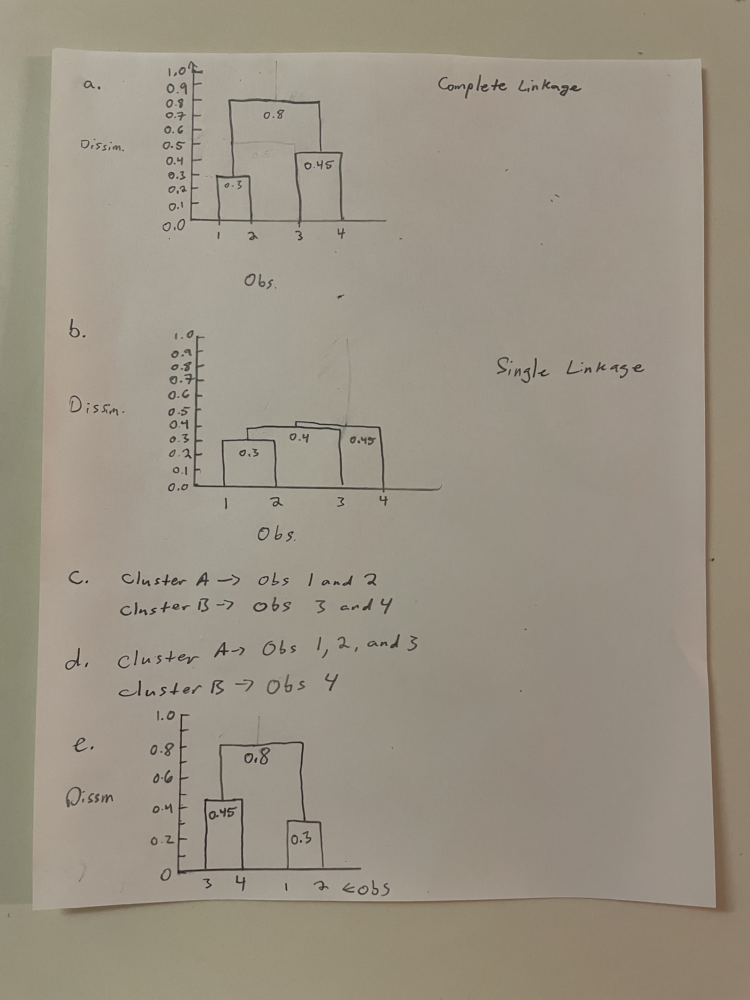

References:

[1] https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html

[2] https://www.geeksforgeeks.org/divide-a-pandas-dataframe-randomly-in-a-given-ratio/

[3] Lesson 7, Slides 91 and 92

[4] https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html

[5] https://www.geeksforgeeks.org/how-to-standardize-data-in-a-pandas-dataframe/

[6] https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html#sklearn.svm.SVC

[7] https://scikit-learn.org/stable/modules/cross_validation.html

[8] https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html#sklearn.svm.LinearSVC

[9] https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

[10] https://www.geeksforgeeks.org/how-to-replace-values-in-column-based-on-condition-in-pandas/

[11] https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

[12] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score

[13] https://www.delftstack.com/howto/python/mode-of-list-in-python/

[14] https://www.sciencedirect.com/topics/engineering/hamming-distance#:~:text=The%20Hamming%20distance%20between%20two%20codewords%20is%20defined%20as%20the,zero%20codewords%20in%20the%20code.

[15] https://www.nlm.nih.gov/nichsr/stats_tutorial/section2/mod8_sd.html#:~:text=A%20standard%20deviation%20(or%20%CF%83,data%20are%20more%20spread%20out.